<a href="https://colab.research.google.com/github/BedinEduardo/Colab_Repositories/blob/master/Dimensionality_Reduction_Example.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# An Example of Dimensionality Reduction

In [ ]:
# Lybraries
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from string import ascii_letters
import seaborn as sns

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("uciml/breast-cancer-wisconsin-data")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/breast-cancer-wisconsin-data


In [ ]:
# Loading the datasets
BREAST_CANCER_FILE = "data.csv"
def load_data(data=BREAST_CANCER_FILE):
    return pd.read_csv(data)

df = load_data()

In [ ]:
# Exploring the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [ ]:
# Cleaning the empty column e id
df = df.drop(columns=["Unnamed: 32","id"])

In [ ]:
# Building test and train sets
from sklearn.model_selection import train_test_split

train_set, test_set = train_test_split(df, test_size=0.2) #, random_state=RANDOM_SEED)


In [ ]:
X_train = train_set.drop(columns=["diagnosis"])
y_train = train_set["diagnosis"].copy()

In [ ]:
# Separating the variables
X_test = test_set.drop(columns=["diagnosis"])
y_test = test_set["diagnosis"].copy()

In [ ]:
print(f"X_test: {X_test}")

X_test:      radius_mean  texture_mean  perimeter_mean  area_mean  smoothness_mean  \
188        11.81         17.39           75.27      428.9          0.10070   
560        14.05         27.15           91.38      600.4          0.09929   
331        12.98         19.35           84.52      514.0          0.09579   
468        17.60         23.33          119.00      980.5          0.09289   
332        11.22         19.86           71.94      387.3          0.10540   
..           ...           ...             ...        ...              ...   
559        11.51         23.93           74.52      403.5          0.09261   
194        14.86         23.21          100.40      671.4          0.10440   
32         17.02         23.98          112.80      899.3          0.11970   
62         14.25         22.15           96.42      645.7          0.10490   
215        13.86         16.93           90.96      578.9          0.10260   

     compactness_mean  concavity_mean  concave points_m

In [ ]:
print(y_test)

188    B
560    B
331    B
468    M
332    B
      ..
559    B
194    M
32     M
62     M
215    M
Name: diagnosis, Length: 114, dtype: object


In [ ]:
# Analysing the classes frquency in the dependent variable - to obtain a minimal benchmark
y_class_count = dict(y_train.value_counts())
y_samples_sum = sum(y_class_count.values())
print("Ocorrência de Tumores Benignos: {0}".format(y_class_count['B']/y_samples_sum))
print("Ocorrência de Tumores Malignos: {0}".format(y_class_count['M']/y_samples_sum))


Ocorrência de Tumores Benignos: 0.6307692307692307
Ocorrência de Tumores Malignos: 0.36923076923076925


In [ ]:
# Transform the dependent variable in binay - for the classificator
y_train = np.where(y_train.str.contains("M"),1,0)
y_test = np.where(y_test.str.contains("M"),1,0)

In [ ]:
print(y_train)

[0 0 1 0 0 0 0 1 0 1 0 0 0 1 0 0 0 1 0 0 1 0 0 0 1 0 1 0 0 0 1 1 1 0 0 0 1
 1 0 0 0 0 0 0 1 0 1 0 1 1 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 1 1 1 0 1 0 0 0
 0 1 0 0 1 1 0 0 0 1 0 0 0 0 0 1 0 1 1 0 0 0 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0
 0 0 0 0 1 0 0 1 1 1 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 1 1 0 0
 0 1 0 0 1 1 0 1 0 0 1 1 0 1 0 1 1 1 0 0 0 0 0 0 1 1 1 0 1 1 0 0 1 0 0 1 0
 1 0 0 0 0 0 0 0 1 0 1 0 1 0 1 0 0 1 1 0 0 1 1 1 0 0 0 1 1 1 0 1 0 1 1 1 1
 1 0 0 0 0 1 1 0 0 0 1 1 0 0 0 1 0 0 1 1 1 1 1 0 0 0 0 0 0 0 0 1 0 1 0 0 0
 0 0 0 0 1 0 0 1 1 1 0 0 0 0 1 0 1 1 0 1 0 0 0 0 1 1 0 0 0 0 0 1 1 0 0 0 1
 1 1 0 0 0 1 0 0 1 1 0 0 0 1 1 0 0 1 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0
 1 1 1 0 0 1 1 0 1 0 0 0 1 0 0 0 0 0 0 1 0 1 0 1 1 0 1 1 0 1 1 0 1 0 1 1 0
 0 0 0 1 1 0 0 0 0 1 0 1 0 1 1 1 1 1 0 1 1 1 0 0 0 1 1 0 0 0 1 0 0 1 0 0 1
 0 0 1 0 0 0 0 1 0 0 0 0 1 1 1 0 0 0 1 0 0 0 1 0 1 1 0 1 0 1 1 0 0 0 1 0 1
 1 1 0 0 0 0 0 0 1 0 0]


In [ ]:
print(y_test)

[0 0 0 1 0 1 0 0 0 0 0 1 1 0 0 1 1 1 0 1 0 0 0 0 0 1 1 1 0 1 0 0 0 1 1 0 0
 0 0 1 1 1 1 1 1 0 0 0 0 0 1 1 1 0 1 1 0 1 0 0 0 1 0 0 1 0 0 1 1 0 0 0 0 0
 0 0 0 0 1 0 0 1 0 0 1 1 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0 1 0 0 0 1 0 1 0 1
 1 1 1]


In [ ]:
# Building a heat map, Pearson correlation matrix
cov_mat = X_train.corr()

#Plot a matrix heatmap, to facilitate the visualization
plt.figure(figsize=(200,200))
sns.set(font_scale=10)
hm = sns.heatmap(cov_mat,
                 cbar=True,
                 annot=True,
                 square=True,
                 fmt='.2f',
                 annot_kws={'size':100},
                 yticklabels=X_train.columns,
                 xticklabels=X_train.columns)

plt.title('Covariance matrix showing correlation coefficients')
plt.tight_layout()
plt.show()

Very similar variables can be described in only one variable

Descritive elimination, is very used in *Feature Selection*

Normalize all the variable to force all be in the same scale.


In [ ]:
from sklearn.preprocessing import StandardScaler

StandardScaler().fit_transform(X_train)

array([[-0.53859208,  0.73854121, -0.57200699, ..., -0.79923434,
         0.26472314, -0.11457256],
       [-0.19547505, -1.52670431, -0.27298983, ..., -1.41940512,
        -1.0527227 , -1.2086496 ],
       [ 0.18881602,  0.75949415,  0.38038854, ...,  1.96935837,
        -0.10536369,  1.7063503 ],
       ...,
       [-0.16528075,  1.32987972, -0.17902439, ...,  0.02841176,
        -0.44540073, -0.55307385],
       [-0.89268885, -0.38360508, -0.86624625, ..., -0.26911987,
        -1.01792821, -0.07376909],
       [-0.37389591,  0.48943405, -0.39482638, ..., -0.90958715,
        -0.70319625, -0.14286296]])

The function StandardScaler transform the feature distribution in gaussian distribution, with average equals 1 and standard deviation 1.

If, one variable that shows less variation in comparision between other, by your scale, the PCA can minimize its impact in principal components building process, but it can increase the information loss.

## Training a Random Forest Classifier without PCA

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import StandardScaler

In [ ]:
forest_clf = RandomForestClassifier(n_estimators=100)

y_probas_forest = cross_val_predict(forest_clf, StandardScaler().fit_transform(X_train), y_train, cv=3,
                                    method="predict_proba", n_jobs=-1)

# Gambiarra bug #9589 Scikit-Learn 0.19.0

y_scores_forest = y_probas_forest[:,1]  # score = prob. to be the positive class
fpr_forest, tpr_forest, threshold_forest  =roc_curve(y_train, y_scores_forest)

In [ ]:
print(y_scores_forest)

[0.01 0.01 0.92 0.2  0.   0.01 0.01 0.91 0.   0.85 0.67 0.01 0.   0.84
 0.06 0.2  0.   0.35 0.03 0.   1.   0.   0.02 0.04 0.97 0.   1.   0.
 0.04 0.01 0.06 0.99 1.   0.21 0.   0.56 1.   1.   0.   0.   0.06 0.06
 0.12 0.   0.98 0.   0.58 0.07 0.87 0.95 0.02 0.   0.01 0.   0.36 0.32
 0.99 0.98 0.01 0.   0.01 0.1  0.   0.99 0.03 0.01 0.98 0.96 0.88 0.08
 0.87 0.   0.   0.   0.6  0.99 0.01 0.49 0.64 1.   0.   0.23 0.   1.
 0.39 0.02 0.   0.02 0.01 0.53 0.11 0.99 1.   0.1  0.02 0.   0.03 0.
 0.99 0.01 0.02 0.01 0.01 0.98 0.   0.01 0.86 0.02 0.04 0.09 0.   0.
 0.02 0.   0.   0.99 0.   0.21 1.   1.   1.   0.01 0.03 0.69 0.   0.14
 0.11 1.   0.25 0.   1.   0.14 0.02 0.   0.   0.   0.   0.03 0.   0.
 0.12 1.   0.   0.   0.99 0.99 0.   0.01 0.22 0.26 0.   0.   0.58 0.54
 0.63 1.   0.08 0.   0.89 0.88 0.08 0.55 0.05 0.9  1.   0.84 0.01 0.79
 0.34 0.19 0.43 0.   0.46 1.   0.45 0.19 0.96 0.94 0.25 0.07 0.99 0.
 0.54 0.99 0.1  0.97 0.   0.   0.01 0.09 0.01 0.   0.05 0.99 0.   0.99
 0.   0.79 0.01 0.

In [ ]:
print(fpr_forest)
print("\n")
print(tpr_forest)
print("\n")
print(threshold_forest)

[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.00348432 0.00348432
 0.00348432 0.00696864 0.00696864 0.01045296 0.01045296 0.0174216
 0.0174216  0.02439024 0.02439024 0.02787456 0.02787456 0.03484321
 0.03484321 0.03484321 0.03832753 0.03832753 0.04181185 0.05226481
 0.05574913 0.05574913 0.05923345 0.07317073 0.07317073 0.08362369
 0.08710801 0.09756098 0.1010453  0.11498258 0.12891986 0.13240418
 0.14285714 0.14982578 0.1533101  0.16376307 0.19163763 0.19860627
 0.22648084 0.2543554  0.27526132 0.31010453 0.36236934 0.44250871
 0.56445993 1.        ]


[0.         0.32738095 0.48809524 0.54166667 0.57142857 0.67857143
 0.68452381 0.70238095 0.70833333 0.72619048 0.73214286 0.74404762
 0.76190476 0.78571429 0.82142857 0.83333333 0.85119048 0.86309524
 0.88095238 0.88095238 0.88690476 0.88690476 0.89285714 0.89285714
 0.9047619  0.9047619  0.92261905 0.92857143 0.940476

With the model trained and cross validated, lets plot the ROC curve to obtain the area under the curve and get to determine the model performance

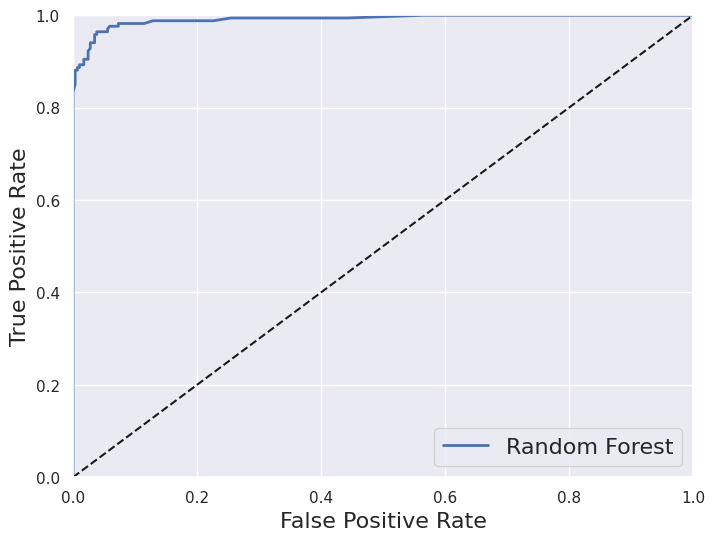

0.9915173386427741


In [ ]:
sns.set(font_scale=1)
plt.figure(figsize=(8,6))
plt.plot(fpr_forest, tpr_forest, linewidth=2, label="Random Forest")
plt.plot([0,1], [0,1], 'k--')
plt.axis([0,1,0,1])
plt.xlabel('False Positive Rate', fontsize=16)
plt.ylabel('True Positive Rate', fontsize=16)
plt.legend(loc="lower right", fontsize=16)
plt.show()
print(auc(fpr_forest, tpr_forest))

## Training a Random Forest Classifier with PCA

Adding a PCA module

The minimal number of principal componets, to be used in this classifier, will be equivalent and summed by a 95% of the variables variance.

In [ ]:
from sklearn.decomposition import PCA

# Defining the minimal sum of princiapal components variance

pca = PCA(0.95)
principalComponents = pca.fit_transform(StandardScaler().fit_transform(X_train))
principalDf = pd.DataFrame(data = principalComponents)

principalDf

,0,1,2,3,4,5,6,7,8,9
0,-2.882048,-0.986408,-0.788676,1.780439,-0.209215,0.190543,-0.712688,0.342390,0.171339,-0.018483
1,-4.654609,-3.135658,-0.006556,-1.239398,1.372519,0.600240,-0.547859,-0.045104,-0.473752,-0.292964
2,4.751016,3.065305,-1.626961,0.763135,2.844700,-0.380158,0.546700,-0.054721,0.293601,-0.469606
3,0.190072,0.234820,-0.990898,-0.888250,0.843442,0.559063,-0.065409,-0.261613,0.178847,-0.088540
4,-1.632149,0.555800,-1.676713,-1.183744,-0.256449,0.450731,-0.215619,-0.874090,-0.369451,0.094695
...,...,...,...,...,...,...,...,...,...,...
450,-3.181421,-1.824679,0.063792,-1.352937,0.473719,-1.159481,0.052638,-0.047190,-0.712768,-0.441111
451,-4.100462,-1.434888,0.921651,0.160297,-0.659541,0.851544,-0.353545,0.010858,-0.568674,-0.053455
452,-0.454996,-1.355036,-0.108306,1.984240,-0.220029,-0.585991,0.001133,-0.195685,0.786647,-0.317451
453,-2.165605,1.445063,0.302752,0.626990,0.605891,-1.575349,0.636258,-0.200011,0.138320,-0.347022


The principal components are those that represent the variable information majority.

In [ ]:
print(f'Variancy by principal component: {format(pca.explained_variance_ratio_)}')

Variancy by principal component: [0.43744073 0.19462353 0.09915538 0.06531171 0.05401084 0.03869596
 0.02245468 0.01496524 0.01446794 0.01116955]


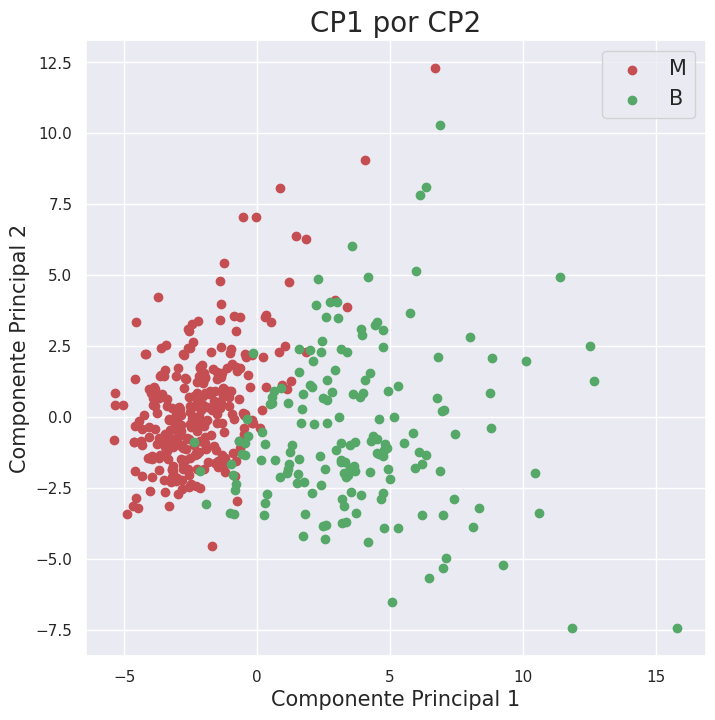

In [ ]:
# A 2D chart to understand the principal components and its contributions
targets = [0, 1]
labels = ["M", "B"]
colors = ['r', 'g']
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)
ax.set_xlabel('Componente Principal 1', fontsize = 15)
ax.set_ylabel('Componente Principal 2', fontsize = 15)
ax.set_title('CP1 por CP2', fontsize = 20)
for target, color in zip(targets,colors):
    indicesToKeep = y_train == target
    ax.scatter((principalDf.loc[indicesToKeep, 0])
               , (principalDf.loc[indicesToKeep, 1]), c = color)
ax.legend(labels, prop={'size': 15})

It is possible to observe that there is a line that separate the two groups, and also is observable, that the red group is more compact that than green.


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import roc_curve

forest_clf_pca = RandomForestClassifier(n_estimators=100, random_state=42)

y_probas_forest = cross_val_predict(forest_clf_pca, princiapalDf,
                                    y_train, cv=3, method="predict_proba", n_jobs=-1)

y_socres_forest = y_probas_forest[:, 1]

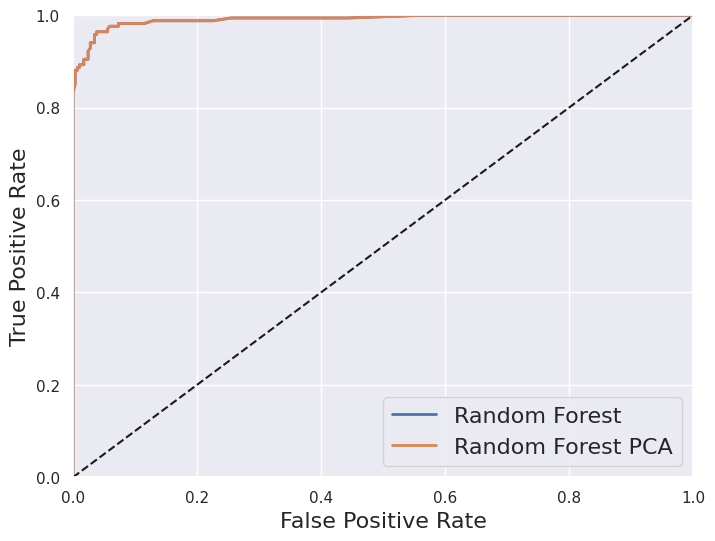

Random Forest: 0.9915173386427741
Random Forest PCA: 0.9915173386427741


In [ ]:
fpr_forest_pca, tpr_forest_pca, thresholds_forest_pca = roc_curve(y_train, y_scores_forest)
sns.set(font_scale=1)
plt.figure(figsize=(8, 6))
plt.plot(fpr_forest, tpr_forest, linewidth=2, label="Random Forest")
plt.plot(fpr_forest_pca, tpr_forest_pca, linewidth=2, label="Random Forest PCA")
plt.plot([0, 1], [0, 1], 'k--')
plt.axis([0, 1, 0, 1])
plt.xlabel('False Positive Rate', fontsize=16)
plt.ylabel('True Positive Rate', fontsize=16)
plt.legend(loc="lower right", fontsize=16)
plt.show()
print("Random Forest: "+str(auc(fpr_forest, tpr_forest)))
print("Random Forest PCA: "+str(auc(fpr_forest_pca, tpr_forest_pca)))

Not necessary a performance increase, but several times the speed performance is increased.
